In [1]:
import alphalens
import pandas  as pd
import numpy as np
import warnings
from talib import EMA
warnings.filterwarnings('ignore')

In [2]:
#读取本地数据和处理-本地数据是宽表的(date,code,values)的dataframe格式
zxindex_ohlcv_stack = pd.read_csv('zxindex_ohlcv_stack.csv', index_col='date', parse_dates=True)

#探索把这里改成循环
zxindex_close = zxindex_ohlcv_stack[['code','close']]
zxindex_close = zxindex_close.pivot(columns='code', values='close')
zxindex_close = zxindex_close.apply(pd.to_numeric, errors='coerce')

zxindex_open = zxindex_ohlcv_stack[['code','open']]
zxindex_open = zxindex_open.pivot(columns='code', values='open')
zxindex_open = zxindex_open.apply(pd.to_numeric, errors='coerce')

zxindex_high = zxindex_ohlcv_stack[['code','high']]
zxindex_high = zxindex_high.pivot(columns='code', values='high')
zxindex_high = zxindex_high.apply(pd.to_numeric, errors='coerce')

zxindex_low = zxindex_ohlcv_stack[['code','low']]
zxindex_low = zxindex_low.pivot(columns='code', values='low')
zxindex_low = zxindex_low.apply(pd.to_numeric, errors='coerce')

zxindex_volume = zxindex_ohlcv_stack[['code','volume']]
zxindex_volume = zxindex_volume.pivot(columns='code', values='volume')
zxindex_volume = zxindex_volume.apply(pd.to_numeric, errors='coerce')

zxindex_amount = zxindex_ohlcv_stack[['code','amount']]
zxindex_amount = zxindex_amount.pivot(columns='code', values='amount')
zxindex_amount = zxindex_amount.apply(pd.to_numeric, errors='coerce')

In [53]:
zxindex_turnover = zxindex_ohlcv_stack[['code','turnover']]
zxindex_turnover = zxindex_turnover.pivot(columns='code', values='turnover')
zxindex_turnover = zxindex_turnover.apply(pd.to_numeric, errors='coerce')

In [ ]:
#factor_df,price_df都是dataframe格式的数据
#因子分析函数
def alphalens_analyze(factor_df,price_df,quantiles=5):
     #factor数据需要转为以(date code)为双重索引的 Series
    factor_2idx_series = factor_df.stack()
    factor_2idx_series.index.set_names(['date', 'code'], inplace=True)
    # 为Series本身设置一个名称，反映其包含的数据
    #factor_2idx_series.name = 'SencondMomentum_5_10_20'
    factor_data=alphalens.utils.get_clean_factor_and_forward_returns(factor_2idx_series,price_df,quantiles=5)
    factor_data[np.isnan(factor_data)] = 0
    factor_data[np.isinf(factor_data)] = 0
    res = alphalens.tears.create_full_tear_sheet(factor_data,long_short=True,group_neutral=False,by_group=False)
    return res

In [6]:
def second_order_mom(close_df,window, window1, window2):
    # 动量-二阶动量
    step_a = (close_df -close_df.apply(lambda x: x.dropna().rolling(window1).mean(engine="numba")).shift(1)).div(close_df)

    return (step_a - step_a.shift(window2)).apply(
        lambda x: np.nan if x.dropna().empty else EMA(x.dropna(), window))
SencondMomentum_5_10_20 = second_order_mom(zxindex_close,5,10,20)
alphalens_analyze(SencondMomentum_5_10_20,zxindex_close,quantiles=5)

In [19]:
def diff_period_mom(close_df,window1, window2):
    # 动量-动量期限差
    if window1 <= window2:
        raise ValueError(f"diff_period_mom:window1({window1})不能小于window2({window2})")
    return (close_df - close_df.shift(window1)) / close_df.shift(window1
    ) - (close_df - close_df.shift(window2)) / close_df.shift(window2)
diff_period_mom_10_5 = diff_period_mom(zxindex_close,10,5)
alphalens_analyze(diff_period_mom_10_5,zxindex_close,quantiles=5)

In [32]:
def amount_std(amount_df,window):
    # 波动率-成交金额波动
    return -amount_df.apply(lambda x: x.dropna().rolling(window).std(engine="numba"))
amount_std_5 = amount_std(zxindex_amount,5)
alphalens_analyze(amount_std_5,zxindex_close,quantiles=5)

Dropped 1.0% entries from factor data: 0.8% in forward returns computation and 0.1% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1.0,-464.636386,-22.505730,-187.478452,99.648466,7301,23.500821
2.0,-363.651238,-37.401192,-153.357099,83.570347,5664,18.231564
3.0,-320.233520,-24.464785,-121.560819,69.636498,5528,17.793800
4.0,-304.434824,-16.562383,-96.816132,58.302591,5664,18.231564
5.0,-279.971045,-0.000000,-47.505610,42.291877,6910,22.242251


Returns Analysis


,1D,5D,10D
Ann. alpha,0.022,0.008,0.012
beta,-0.128,-0.138,-0.123
Mean Period Wise Return Top Quantile (bps),0.918,0.228,0.440
Mean Period Wise Return Bottom Quantile (bps),-0.178,0.508,0.117
Mean Period Wise Spread (bps),1.096,-0.469,0.027


<Figure size 640x480 with 0 Axes>

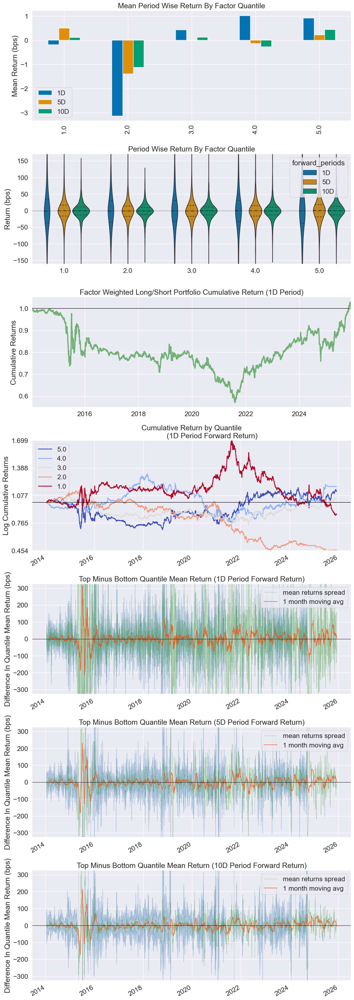

Information Analysis


,1D,5D,10D
IC Mean,0.009,0.007,0.003
IC Std.,0.518,0.516,0.507
Risk-Adjusted IC,0.017,0.014,0.006
t-stat(IC),NaN,NaN,NaN
p-value(IC),NaN,NaN,NaN
IC Skew,NaN,NaN,NaN
IC Kurtosis,NaN,NaN,NaN


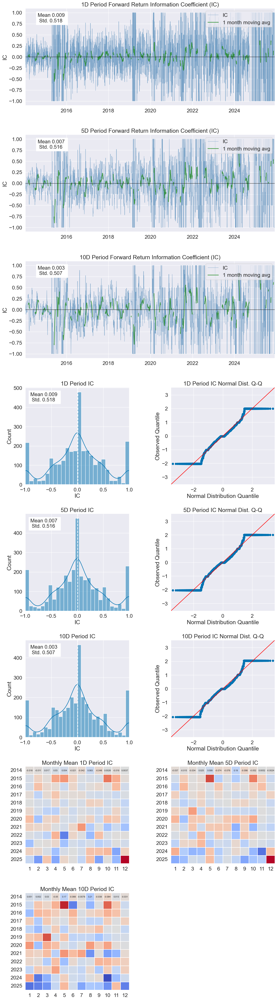

Turnover Analysis


,1D,5D,10D
Quantile 1.0 Mean Turnover,0.309,0.563,0.675
Quantile 2.0 Mean Turnover,0.536,0.755,0.794
Quantile 3.0 Mean Turnover,0.538,0.746,0.795
Quantile 4.0 Mean Turnover,0.489,0.718,0.787
Quantile 5.0 Mean Turnover,0.194,0.341,0.396


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.894,0.634,0.49


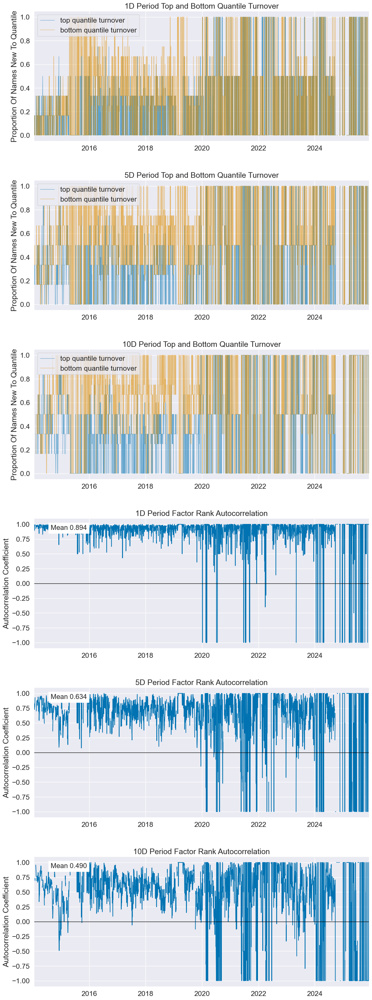

In [51]:
def volume_std(vol_df,window):
    # 波动率-成交量波动率
    return -vol_df.apply(lambda x: x.dropna().rolling(window).std(engine="numba"))

volume_std_10 = amount_std(zxindex_volume,10)
#将价格数据转换为工作日频率,查看该变量的index.freq是否是B
volume_std_10 = volume_std_10.asfreq('B')
alphalens_analyze(volume_std_10,zxindex_close,quantiles=5)

Dropped 0.4% entries from factor data: 0.4% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,0.500000,1.190008,0.906625,0.077453,17352,20.335884
2,0.674887,1.322794,0.973248,0.071211,17352,20.335884
3,0.685271,1.402393,1.009455,0.074383,15919,18.656463
4,0.702973,1.434585,1.046370,0.081263,17352,20.335884
5,0.714839,1.844637,1.121047,0.109552,17352,20.335884


Returns Analysis


,1D,5D,10D
Ann. alpha,0.007,-0.015,-0.015
beta,-0.001,-0.006,-0.005
Mean Period Wise Return Top Quantile (bps),-0.149,-0.948,-1.084
Mean Period Wise Return Bottom Quantile (bps),-0.963,0.194,0.315
Mean Period Wise Spread (bps),0.814,-1.129,-1.380


<Figure size 640x480 with 0 Axes>

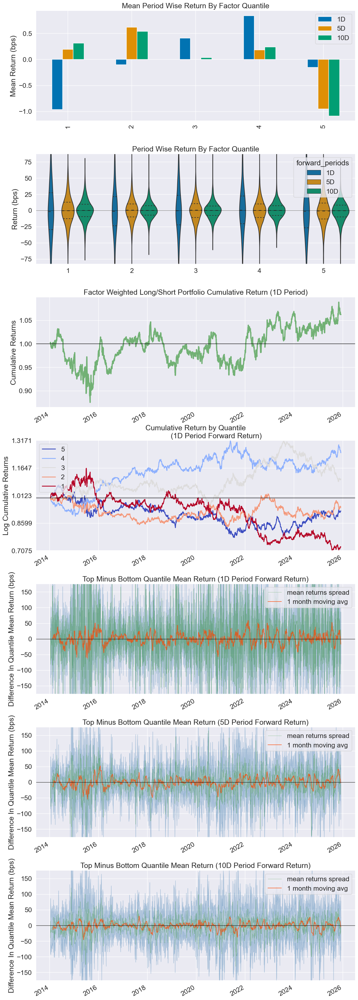

Information Analysis


,1D,5D,10D
IC Mean,0.013,-0.005,-0.007
IC Std.,0.253,0.258,0.260
Risk-Adjusted IC,0.049,-0.019,-0.026
t-stat(IC),2.655,-1.021,-1.394
p-value(IC),0.008,0.307,0.163
IC Skew,0.001,-0.029,-0.002
IC Kurtosis,-0.258,-0.191,-0.336


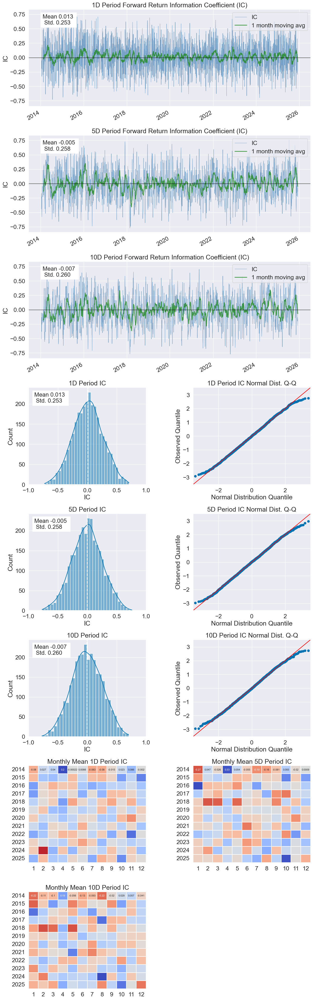

Turnover Analysis


,1D,5D,10D
Quantile 1 Mean Turnover,0.269,0.818,0.823
Quantile 2 Mean Turnover,0.522,0.800,0.798
Quantile 3 Mean Turnover,0.599,0.794,0.801
Quantile 4 Mean Turnover,0.523,0.794,0.794
Quantile 5 Mean Turnover,0.274,0.824,0.815


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.847,-0.118,-0.099


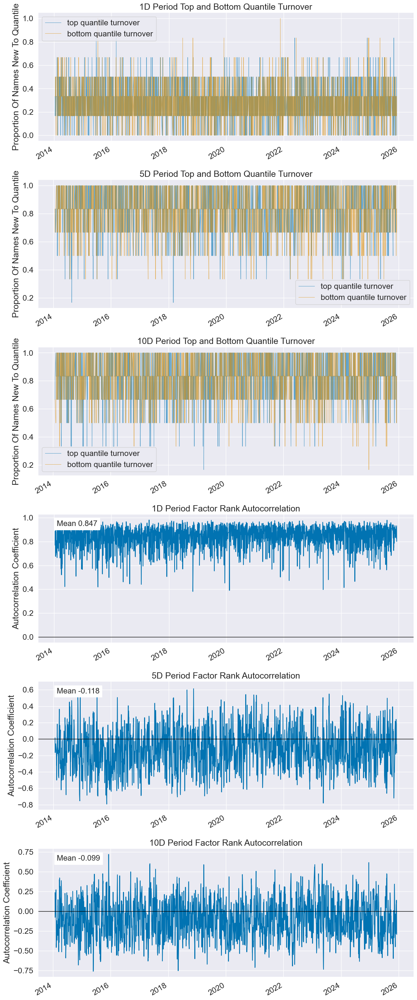

In [54]:
def turnover_pct(turnover_df,window1,window2):
    if window1 <= window2:
        raise ValueError(f"turnover_pct:window1({window1})不能小于window2({window2})")

    avg1 = turnover_df.apply(lambda x: x.dropna().rolling(window1).mean())
    avg2 = turnover_df.apply(lambda x: x.dropna().rolling(window2).mean())
    return avg1.div(avg2)

turnover_pct_10_5 = turnover_pct(zxindex_turnover,10,5)
alphalens_analyze(turnover_pct_10_5,zxindex_close,quantiles=5)

In [56]:
def long_short(close_df,low_df,high_df,window):
    # 多空对比总量，问题很多index提取出来的high和low是一样的
    return -((close_df - low_df).div(high_df - close_df)).apply(lambda x: x.dropna().rolling(window).sum(engine="numba"))

long_short_5 = long_short(zxindex_close,zxindex_low,zxindex_high,5)
long_short_5 = long_short_5.asfreq('B')
alphalens_analyze(long_short_5,zxindex_close,quantiles=5)

Dropped 100.0% entries from factor data: 0.0% in forward returns computation and 100.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).


MaxLossExceededError: max_loss (35.0%) exceeded 100.0%, consider increasing it.

In [58]:
def long_short_pct(close_df,low_df,high_df,vol_df,window1,window2):
    # 多空对比变化，问题很多index提取出来的high和low是一样的
    if window1 <= window2:
        raise ValueError(f"long_short_pct:window1({window1})不能小于window2({window2})")

    step_a = (close_df - low_df - high_df + close_df).div(high_df - low_df)
    step_b = vol_df * step_a
    step_c = step_b.apply(lambda x: EMA(x.dropna(), window1))
    step_d = step_b.apply(lambda x: EMA(x.dropna(), window2))
    return step_c.sub(step_d)

long_short_pct_10_5 = long_short_pct(zxindex_close,zxindex_low,zxindex_high,zxindex_volume,10,5)
long_short_pct_10_5 = long_short_pct_10_5.asfreq('B')
alphalens_analyze(long_short_pct_10_5,zxindex_close,quantiles=5)

Dropped 100.0% entries from factor data: 0.0% in forward returns computation and 100.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).


MaxLossExceededError: max_loss (35.0%) exceeded 100.0%, consider increasing it.

Dropped 1.7% entries from factor data: 1.1% in forward returns computation and 0.6% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1.0,-15.011111,3.666667,-4.913903,2.837608,5508,24.907299
2.0,-11.022222,3.777778,-2.822380,2.146626,3813,17.242471
3.0,-10.577778,5.511111,-1.500692,1.891206,3776,17.075156
4.0,-10.788889,6.955556,-0.218742,1.650247,3810,17.228905
5.0,-11.833333,10.900000,1.487097,2.254480,5207,23.546170


Returns Analysis


,1D,5D,10D
Ann. alpha,-0.019,-0.005,0.005
beta,-0.060,-0.078,-0.149
Mean Period Wise Return Top Quantile (bps),-3.406,-1.071,-0.506
Mean Period Wise Return Bottom Quantile (bps),-0.412,-0.133,0.437
Mean Period Wise Spread (bps),-2.995,-1.076,-1.108


<Figure size 640x480 with 0 Axes>

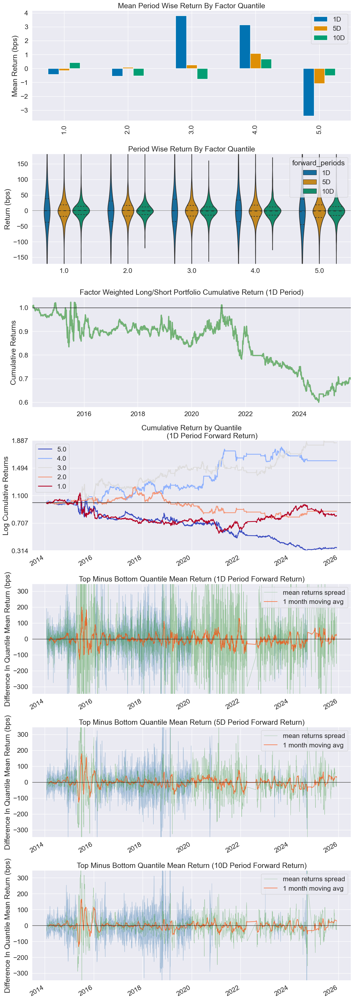

Information Analysis


,1D,5D,10D
IC Mean,-0.017,-0.021,-0.015
IC Std.,0.634,0.629,0.625
Risk-Adjusted IC,-0.026,-0.033,-0.024
t-stat(IC),NaN,NaN,NaN
p-value(IC),NaN,NaN,NaN
IC Skew,NaN,NaN,NaN
IC Kurtosis,NaN,NaN,NaN


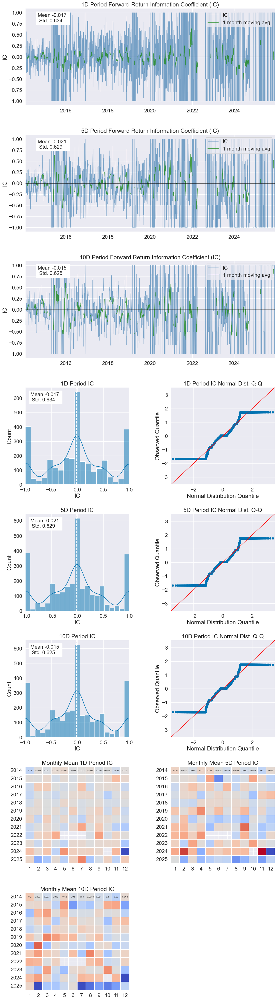

Turnover Analysis


,1D,5D,10D
Quantile 1.0 Mean Turnover,0.243,0.575,0.670
Quantile 2.0 Mean Turnover,0.561,0.791,0.838
Quantile 3.0 Mean Turnover,0.533,0.787,0.825
Quantile 4.0 Mean Turnover,0.527,0.781,0.820
Quantile 5.0 Mean Turnover,0.237,0.541,0.679


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.794,0.337,0.166


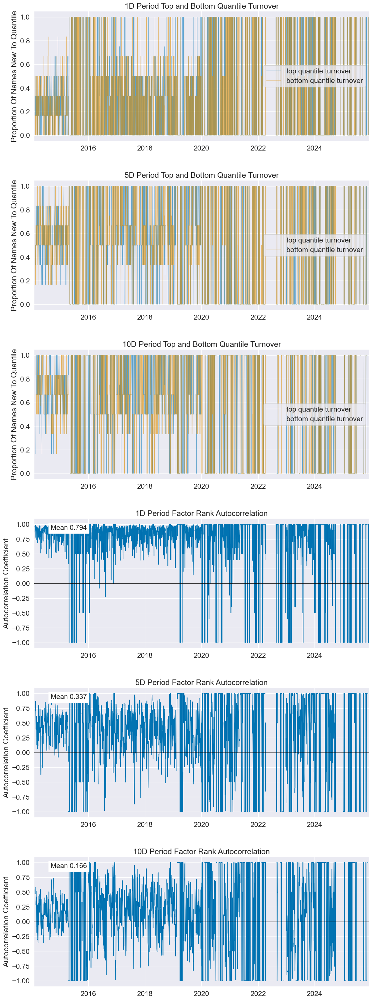

In [60]:
def price_vol_rank_cov(close_df,vol_df,window):
    # 量价背离协方差
    rank_close = close_df.apply(lambda x: x.dropna().rolling(window).rank())
    rank_vol = vol_df.apply(lambda x: x.dropna().rolling(window).rank())
    cov = rank_close.rolling(window).cov(other=rank_vol)
    return -cov

price_vol_rank_cov_5 = price_vol_rank_cov(zxindex_close,zxindex_volume,10)
price_vol_rank_cov_5 = price_vol_rank_cov_5.asfreq('B')
alphalens_analyze(price_vol_rank_cov_5,zxindex_close,quantiles=5)

Dropped 2.0% entries from factor data: 0.1% in forward returns computation and 2.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1.0,-0.968005,0.409126,-0.566377,0.219268,4575,25.249738
2.0,-0.893302,0.359193,-0.394388,0.217834,3127,17.258127
3.0,-0.883143,0.449236,-0.259992,0.234318,2861,15.790055
4.0,-0.815357,0.665922,-0.060395,0.247979,3127,17.258127
5.0,-0.935161,0.864326,0.132166,0.319128,4429,24.443954


Returns Analysis


,1D,5D,10D
Ann. alpha,-0.021,0.001,-0.002
beta,-0.017,-0.038,-0.060
Mean Period Wise Return Top Quantile (bps),0.078,0.441,0.096
Mean Period Wise Return Bottom Quantile (bps),0.600,-0.068,0.285
Mean Period Wise Spread (bps),-0.522,0.468,-0.247


<Figure size 640x480 with 0 Axes>

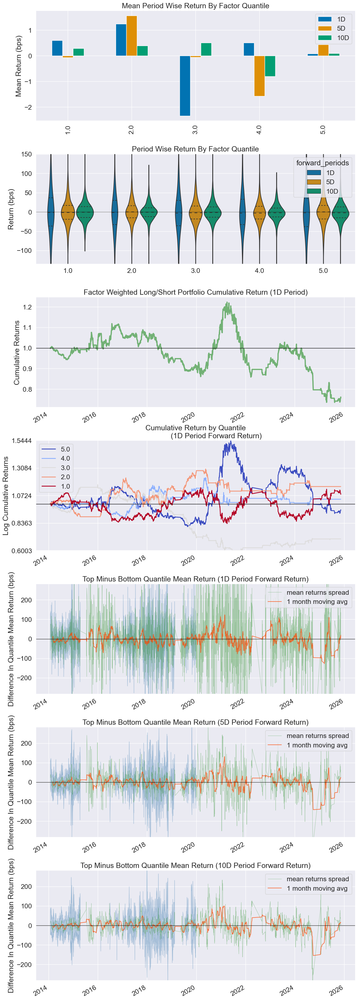

Information Analysis


,1D,5D,10D
IC Mean,-0.006,0.002,-0.028
IC Std.,0.691,0.690,0.697
Risk-Adjusted IC,-0.009,0.003,-0.040
t-stat(IC),NaN,NaN,NaN
p-value(IC),NaN,NaN,NaN
IC Skew,NaN,NaN,NaN
IC Kurtosis,NaN,NaN,NaN


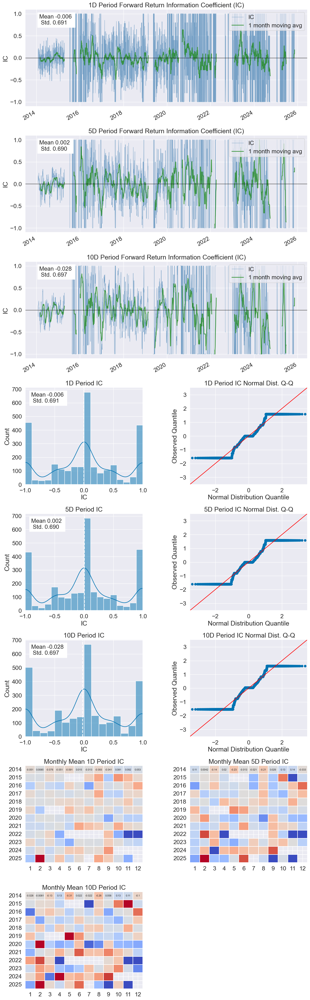

Turnover Analysis


,1D,5D,10D
Quantile 1.0 Mean Turnover,0.161,0.441,0.579
Quantile 2.0 Mean Turnover,0.415,0.720,0.774
Quantile 3.0 Mean Turnover,0.416,0.728,0.806
Quantile 4.0 Mean Turnover,0.391,0.745,0.787
Quantile 5.0 Mean Turnover,0.142,0.421,0.586


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.884,0.545,0.277


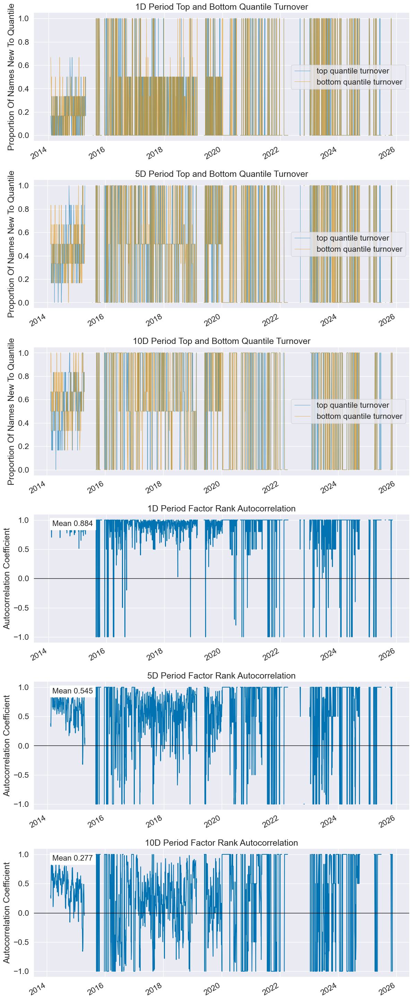

In [63]:
def price_vol_cor(close_df,vol_df,window):
    # 量价相关系数
    return -close_df.rolling(window).corr(vol_df)

price_vol_cor_x = price_vol_cor(zxindex_close,zxindex_volume,20)
alphalens_analyze(price_vol_cor_x,zxindex_close,quantiles=5)

In [64]:
def price_divergence(close_df,open_df,vol_df,window):
    # 一阶量价背离,很多close和open是一个价，导致出现了很多0
    rank_vol = vol_df.pct_change().apply(lambda x: x.dropna().rolling(window).rank())
    rank_price = (close_df.div(open_df) - 1).apply(lambda x: x.dropna().rolling(window).rank())
    return -rank_vol.rolling(window).corr(rank_price)

price_divergence_x = price_divergence(zxindex_close,zxindex_open,zxindex_volume,5)
alphalens_analyze(price_divergence_x,zxindex_close,quantiles=5)

Dropped 100.0% entries from factor data: 97.9% in forward returns computation and 2.1% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).


MaxLossExceededError: max_loss (35.0%) exceeded 100.0%, consider increasing it.

In [65]:
def price_amf(high_df,low_df,vol_df,window):
    # 量幅同向因子
    rank_vol = vol_df.pct_change().apply(lambda x: x.dropna().rolling(window).rank())
    rank_price: pd.DataFrame = (high_df.div(low_df) - 1).apply(lambda x: x.dropna().rolling(window).rank())
    return rank_vol.rolling(window).corr(rank_price)

price_amf_x = price_amf(zxindex_high,zxindex_low,zxindex_volume,5)
alphalens_analyze(price_amf_x,zxindex_close,quantiles=5)

Dropped 100.0% entries from factor data: 98.9% in forward returns computation and 1.1% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).


MaxLossExceededError: max_loss (35.0%) exceeded 100.0%, consider increasing it.

In [17]:
#因子计算函数汇总，为什么一起运行不了呢？
def second_order_mom(close_df,window, window1, window2):
    # 动量-二阶动量
    step_a = (close_df -close_df.apply(lambda x: x.dropna().rolling(window1).mean(engine="numba")).shift(1)).div(close_df)

    return (step_a - step_a.shift(window2)).apply(
        lambda x: np.nan if x.dropna().empty else EMA(x.dropna(), window))

def diff_period_mom(close_df,window1, window2):
    # 动量-动量期限差
    if window1 <= window2:
        raise ValueError(f"diff_period_mom:window1({window1})不能小于window2({window2})")
    return (close_df - close_df.shift(window1)) / close_df.shift(window1
    ) - (close_df - close_df.shift(window2)) / close_df.shift(window2)

def amount_std(amount_df,window):
    # 波动率-成交金额波动
    return -amount_df.apply(lambda x: x.dropna().rolling(window).std(engine="numba"))

def volume_std(vol_df,window):
    # 波动率-成交量波动率
    return -.vol_df.apply(lambda x: x.dropna().rolling(window).std(engine="numba"))

def turnover_pct(turnover_df,window1,window2):
    if window1 <= window2:
        raise ValueError(f"turnover_pct:window1({window1})不能小于window2({window2})")

    avg1 = turnover_df.apply(lambda x: x.dropna().rolling(window1).mean())
    avg2 = turnover_df.apply(lambda x: x.dropna().rolling(window2).mean())
    return avg1.div(avg2)

def long_short(close_df,low_df,high_df,close_df,window):
    # 多空对比总量
    return -((close_df - low_df).div(high_df - close_df)).apply(lambda x: x.dropna().rolling(window).sum(engine="numba"))

def long_short_pct(close_df,low_df,high_df,close_df,window1,window2):
    # 多空对比变化
    if window1 <= window2:
        raise ValueError(f"long_short_pct:window1({window1})不能小于window2({window2})")

    step_a = (close_df - low_df - high_df + close_df).div(high_df - low_df)
    step_b = vol_df * step_a
    step_c = step_b.apply(lambda x: EMA(x.dropna(), window1))
    step_d = step_b.apply(lambda x: EMA(x.dropna(), window2))
    return step_c.sub(step_d)

def price_vol_rank_cov(close_df,vol_df,window):
    # 量价背离协方差
    rank_close = close_df.apply(lambda x: x.dropna().rolling(window).rank())
    rank_vol = vol_df.apply(lambda x: x.dropna().rolling(window).rank())
    cov = rank_close.rolling(window).cov(other=rank_vol)
    return -cov

def price_vol_cor(close_df,vol_df,window):
    # 量价相关系数
    return -close_df.rolling(window).corr(vol_df)

def price_divergence(close_df,open_df,vol_df,window):
    # 一阶量价背离
    rank_vol = vol_df.pct_change().apply(lambda x: x.dropna().rolling(window).rank())
    rank_price = (close_df.div(open_df) - 1).apply(lambda x: x.dropna().rolling(window).rank())
    return -rank_vol.rolling(window).corr(rank_price)

def price_amf(high_df,low_df,vol_df,window):
    # 量幅同向因子
    rank_vol = vol_df.pct_change().apply(lambda x: x.dropna().rolling(window).rank())
    rank_price: pd.DataFrame = (high_df.div(low_df) - 1).apply(lambda x: x.dropna().rolling(window).rank())
    return rank_vol.rolling(window).corr(rank_price)

SyntaxError: invalid syntax (1395662324.py, line 22)